#  Importing Necessary Libraries

In [380]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

#### Importing Warnings and seting max columns and rows

In [381]:
import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

####Importing the necessary files for the project and assinging it to different Variable

In [382]:
df= pd.read_csv('roadAccStats13-16.csv')
df1= pd.read_csv('Details_of_road_accident_deaths_by_situation_state_2014.csv')
df2= pd.read_csv('Persons_killed_due_to_Non-use_of_Safety_Device_2016.csv')
df3= pd.read_excel('accidents03-16.xls')
df4= pd.read_csv('laneAccidents.csv')
df5= pd.read_csv('reasonOfAccident.csv')
df6= pd.read_csv('typeOfVehicle.csv')
df7= pd.read_excel('timeOfOccurence.xls')


WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


## Q1. The percentage of road accidents during all the years.

In [383]:
df.tail(13) # checking for nan values if found replace with mean as we can see 2013 collumn has one nan value in telangana

,SI. No.,States/UTs,State/UT-Wise Total Number of Road Accidents during - 2013,State/UT-Wise Total Number of Road Accidents during - 2014,State/UT-Wise Total Number of Road Accidents during - 2015,State/UT-Wise Total Number of Road Accidents during - 2016,Share of States/UTs in Total Number of Road Accidents - 2013,Share of States/UTs in Total Number of Road Accidents - 2014,Share of States/UTs in Total Number of Road Accidents - 2015,Share of States/UTs in Total Number of Road Accidents - 2016,Total Number of Accidents Per Lakh Population - 2013,Total Number of Accidents Per Lakh Population - 2014,Total Number of Accidents Per Lakh Population - 2015,Total Number of Accidents Per Lakh Population - 2016,"Total Number of Road Accidents per 10,000 Vehicles - 2013","Total Number of Road Accidents per 10,000 Vehicles - 2014","Total Number of Road Accidents per 10,000 Vehicles - 2015","Total Number of Road Accidents per 10,000 Km of Roads - 2013","Total Number of Road Accidents per 10,000 Km of Roads - 2014","Total Number of Road Accidents per 10,000 Km of Roads - 2015"
24,25,Telangana,NaN,20078,21252,22811,0.0,4.1,4.2,4.7,NaN,NaN,NaN,NaN,NaN,28.4,27.1,NaN,2177.3,2119.9
25,26,Tripura,818.0,716,647,557,0.2,0.1,0.1,0.1,22.1,19.1,17.1,14.6,33.4,28.0,22.9,263.7,171.1,173.1
26,27,Uttarakhand,1297.0,1410,1523,1591,0.3,0.3,0.3,0.3,12.7,13.6,14.5,15.0,8.9,8.6,8.3,220.9,233.3,242.0
27,28,Uttar Pradesh,30615.0,31034,32385,35612,6.3,6.3,6.5,7.4,14.7,14.7,15.1,16.3,18.0,16.2,15.0,702.2,781.3,779.6
28,29,West Bengal,12414.0,12875,13208,13580,2.6,2.6,2.6,2.8,13.6,14.0,14.2,14.5,27.6,19.1,17.8,400.8,410.4,446.2
29,30,Andaman & Nicobar Islands,200.0,218,258,238,0.0,0.0,0.1,0.0,38.5,40.9,47.5,43.2,23.4,23.3,25.2,1440.9,1654.0,1908.3
30,31,Chandigarh,410.0,369,416,428,0.1,0.1,0.1,0.1,25.9,22.4,24.2,24.0,3.7,5.9,6.1,2057.2,1281.6,1417.4
31,32,Dadra & Nagar Haveli,91.0,87,69,70,0.0,0.0,0.0,0.0,23.5,21.6,16.7,16.6,9.7,8.5,6.2,1123.5,1034.5,797.7
32,33,Daman & Diu,59.0,39,70,71,0.0,0.0,0.0,0.0,20.1,12.8,22.1,21.5,6.4,4.1,7.0,3105.3,769.2,1341.0
33,34,Delhi,7566.0,8623,8085,7375,1.6,1.8,1.6,1.5,38.7,42.9,39.1,34.6,9.7,10.4,9.1,2364.7,2695.0,2521.3


#### Replacing nan value with 0

In [384]:
df['State/UT-Wise Total Number of Road Accidents during - 2013']=df['State/UT-Wise Total Number of Road Accidents during - 2013'].replace(np.nan,0)

#### Finding the mean of the all the states 

In [385]:
avg_accident_2013 = df[df['States/UTs']!="Total"]['State/UT-Wise Total Number of Road Accidents during - 2013'].mean()
avg_accident_2013

13513.222222222223

#### Replacing the mean value in telangana 

In [386]:
df['State/UT-Wise Total Number of Road Accidents during - 2013']=df['State/UT-Wise Total Number of Road Accidents during - 2013'].replace(0,avg_accident_2013)

#### Now finding the sum of that collumn 

In [387]:
updated_2013_accident = df[df['States/UTs']!="Total"]['State/UT-Wise Total Number of Road Accidents during - 2013'].sum().round()
updated_2013_accident

499989.0

#### Replacing the previous sum with updated sum 

In [388]:
df['State/UT-Wise Total Number of Road Accidents during - 2013']=df['State/UT-Wise Total Number of Road Accidents during - 2013'].replace(df[df['States/UTs']=="Total"]['State/UT-Wise Total Number of Road Accidents during - 2013'].max(),updated_2013_accident)


#### Setting the total of each collumn to a variable

In [389]:
a_2013 = df[df['States/UTs']=='Total']['State/UT-Wise Total Number of Road Accidents during - 2013'].max()
a_2014 = df[df['States/UTs']=='Total']['State/UT-Wise Total Number of Road Accidents during - 2014'].max()
a_2015 = df[df['States/UTs']=='Total']['State/UT-Wise Total Number of Road Accidents during - 2015'].max()
a_2016 = df[df['States/UTs']=='Total']['State/UT-Wise Total Number of Road Accidents during - 2016'].max()


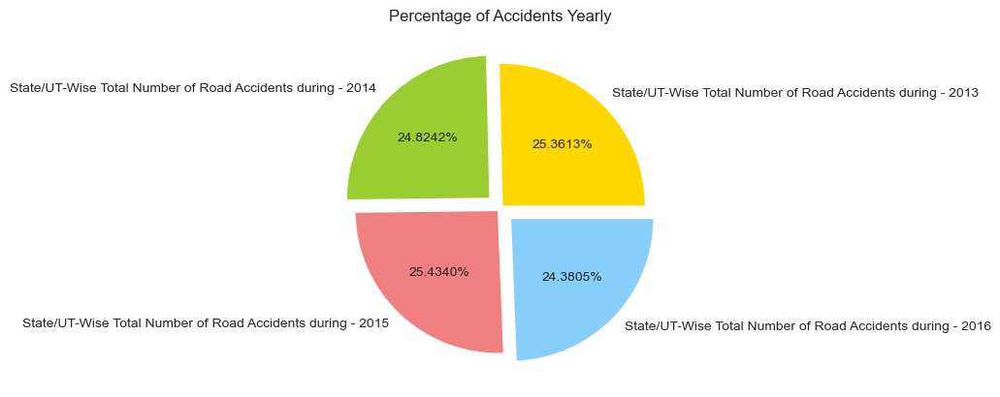

In [390]:
# Creating Pie Chart
x = [a_2013, a_2014, a_2015, a_2016] # data to be feeded in pie chart
y = ['State/UT-Wise Total Number of Road Accidents during - 2013', # label names
    'State/UT-Wise Total Number of Road Accidents during - 2014',
    'State/UT-Wise Total Number of Road Accidents during - 2015',
    'State/UT-Wise Total Number of Road Accidents during - 2016']
colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue'] # colors

plt.title("Percentage of Accidents Yearly") # title
plt.pie(x, labels=y, explode = (0.02,0.1,0.02,0.1), autopct='%1.4f%%', colors=colors) # code for pie chart
plt.show()

## Q2. Mean Accidents per 1L population for each year.

In [391]:
df_data = df[df['States/UTs']!='Total'] # assinging the original data frame to a new variable df_data

In [392]:
df_data.isnull().sum() # checking for null values

SI. No.                                                         0
States/UTs                                                      0
State/UT-Wise Total Number of Road Accidents during - 2013      0
State/UT-Wise Total Number of Road Accidents during - 2014      0
State/UT-Wise Total Number of Road Accidents during - 2015      0
State/UT-Wise Total Number of Road Accidents during - 2016      0
Share of States/UTs in Total Number of Road Accidents - 2013    0
Share of States/UTs in Total Number of Road Accidents - 2014    0
Share of States/UTs in Total Number of Road Accidents - 2015    0
Share of States/UTs in Total Number of Road Accidents - 2016    0
Total Number of Accidents Per Lakh Population - 2013            1
Total Number of Accidents Per Lakh Population - 2014            1
Total Number of Accidents Per Lakh Population - 2015            1
Total Number of Accidents Per Lakh Population - 2016            1
Total Number of Road Accidents per 10,000 Vehicles - 2013       1
Total Numb

#### Repllacing the null values with median

In [393]:
df_data['Total Number of Accidents Per Lakh Population - 2013']=df_data['Total Number of Accidents Per Lakh Population - 2013'].replace(np.nan, df_data['Total Number of Accidents Per Lakh Population - 2013'].median())

df_data['Total Number of Accidents Per Lakh Population - 2014']=df_data['Total Number of Accidents Per Lakh Population - 2014'].replace(np.nan, df_data['Total Number of Accidents Per Lakh Population - 2014'].median())

df_data['Total Number of Accidents Per Lakh Population - 2015']=df_data['Total Number of Accidents Per Lakh Population - 2015'].replace(np.nan, df_data['Total Number of Accidents Per Lakh Population - 2015'].median())

df_data['Total Number of Accidents Per Lakh Population - 2016']=df_data['Total Number of Accidents Per Lakh Population - 2016'].replace(np.nan, df_data['Total Number of Accidents Per Lakh Population - 2016'].median())



#### Finding Mean of each Columns

In [394]:
avg_2013 = df_data['Total Number of Accidents Per Lakh Population - 2013'].mean()
avg_2014 = df_data['Total Number of Accidents Per Lakh Population - 2014'].mean()
avg_2016 = df_data['Total Number of Accidents Per Lakh Population - 2016'].mean()
avg_2015 = df_data['Total Number of Accidents Per Lakh Population - 2015'].mean()


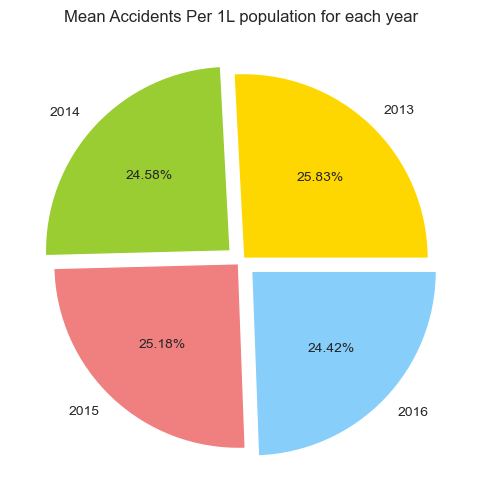

In [395]:
label_df_data = ['2013', '2014', '2015', '2016']
          
sizes = [avg_2013, avg_2014, avg_2015, avg_2016]
          
colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue']
explode = (0.02, 0.08, 0.02, 0.08)  # explode slice


plt.figure(figsize=(6,6))
plt.pie(sizes, explode=explode, labels=label_df_data, colors=colors, autopct='%1.2f%%')
plt.title('Mean Accidents Per 1L population for each year')
plt.show()

## Q3. The highest number of accident states and least number of accident states. 

In [396]:
df_edit = df[df['States/UTs']!='Total'] #Assinging original data frame to new variable as per need

#### Finding the min and max states 

In [397]:
state = df_edit[df_edit['Total Number of Accidents Per Lakh Population - 2013']==df_edit['Total Number of Accidents Per Lakh Population - 2013'].min()]['States/UTs']
states = []

for count, collumns in enumerate(df):
    if count>=10 and count<=13:
        min = df_edit[df_edit[f'{collumns}']==df_edit[f'{collumns}'].min()]['States/UTs']
        min = min.iloc[0]
        states.append(min)
        
        max = df_edit[df_edit[f'{collumns}']==df_edit[f'{collumns}'].max()]['States/UTs']
        max = max.iloc[0]
        states.append(max)

#### Creating data for a new DataFrame

In [398]:
data = [['2013', df_edit['Total Number of Accidents Per Lakh Population - 2013'].min(), 'MIN'],
       ['2013', df_edit['Total Number of Accidents Per Lakh Population - 2013'].max(), 'MAX'],
       ['2014', df_edit['Total Number of Accidents Per Lakh Population - 2014'].min(),'MIN'],
       ['2014', df_edit['Total Number of Accidents Per Lakh Population - 2014'].max(),'MAX'],
       ['2015', df_edit['Total Number of Accidents Per Lakh Population - 2015'].min(),'MIN'],
       ['2015', df_edit['Total Number of Accidents Per Lakh Population - 2015'].max(),'MAX'],
       ['2016', df_edit['Total Number of Accidents Per Lakh Population - 2016'].min(),'MIN'],
       ['2016', df_edit['Total Number of Accidents Per Lakh Population - 2016'].max(),'MAX']]

In [399]:
df_count = pd.DataFrame(data, columns= ['Year', 'Values', 'MIN/MAX'])# new data frame df_count created
df_count

,Year,Values,MIN/MAX
0,2013,1.3,MIN
1,2013,229.9,MAX
2,2014,1.3,MIN
3,2014,220.8,MAX
4,2015,2.3,MIN
5,2015,222.1,MAX
6,2016,1.2,MIN
7,2016,217.7,MAX


### Creating Bar Chart For the Representation of data

Minimum Number of Accident for State in the year 2013 --- Lakshadweep 
Maximum Number of Accident for State in the year 2013 --- Goa 
Minimum Number of Accident for State in the year 2014 --- Lakshadweep 
Maximum Number of Accident for State in the year 2014 --- Goa 
Minimum Number of Accident for State in the year 2015 --- Nagaland 
Maximum Number of Accident for State in the year 2015 --- Goa 
Minimum Number of Accident for State in the year 2016 --- Lakshadweep 
Maximum Number of Accident for State in the year 2016 --- Goa 


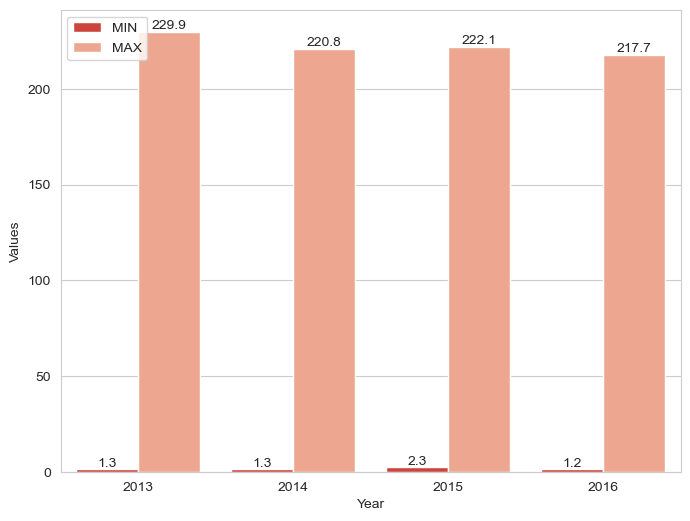

In [400]:
Year = 2013

for i in range(0,len(states)):
    if i%2==0:
        print(f"Minimum Number of Accident for State in the year {Year} --- {states[i]} ")
    else:
        print(f"Maximum Number of Accident for State in the year {Year} --- {states[i]} ")
    
    if i>0 and i%2!=0:
        Year+=1

fig, ax = plt.subplots(figsize=(8, 6))
sns.set_style('whitegrid')
sns.barplot(x='Year', y='Values', hue='MIN/MAX', data=df_count,palette='Reds_r')
plt.legend(loc=2)

for count, container in enumerate(ax.containers):
    ax.bar_label(container)
plt.show()

## Q4. Offenders and victims who died according to gender as well the as the total deaths. 

In [401]:
df1_cut = df1.iloc[-1:,3:11] # slicing the original data and assing it to a new variable
df1_cut

,Offenders (Driver/Pedestrian) Died_Male,Offenders (Driver/Pedestrian) Died_Female,Offenders (Driver/Pedestrian) Died_Transgender,Offenders (Driver/Pedestrian) Died_Total,Victims Died_Male,Victims Died_Female,Victims Died_Transgender,Victims Died_Total
1442,31449,2803,0,34252,89683,17574,17,107274


### Slicing it further and saving it to a new variable for the final chart prepration

In [402]:
df1_cut_data = [['Offenders', df1_cut['Offenders (Driver/Pedestrian) Died_Male'].max(),df1_cut['Offenders (Driver/Pedestrian) Died_Female'].max(),df1_cut['Offenders (Driver/Pedestrian) Died_Transgender'].max(),df1_cut['Offenders (Driver/Pedestrian) Died_Total'].max()],
               ['Victims', df1_cut['Victims Died_Male'].max(), df1_cut['Victims Died_Female'].max(), df1_cut['Victims Died_Transgender'].max(), df1_cut['Victims Died_Total'].max()]
               ]

In [403]:
df1_main = pd.DataFrame(df1_cut_data, columns=['Type','Male','Female','Transgender','Total']) # pandas data frame created
df1_main

,Type,Male,Female,Transgender,Total
0,Offenders,31449,2803,0,34252
1,Victims,89683,17574,17,107274


In [404]:
# using melt function to unpivot the tabel
df1_main_melt= df1_main.melt(id_vars='Type',value_vars=['Male','Female','Transgender','Total'], var_name='Categories')
df1_main_melt

,Type,Categories,value
0,Offenders,Male,31449
1,Victims,Male,89683
2,Offenders,Female,2803
3,Victims,Female,17574
4,Offenders,Transgender,0
5,Victims,Transgender,17
6,Offenders,Total,34252
7,Victims,Total,107274


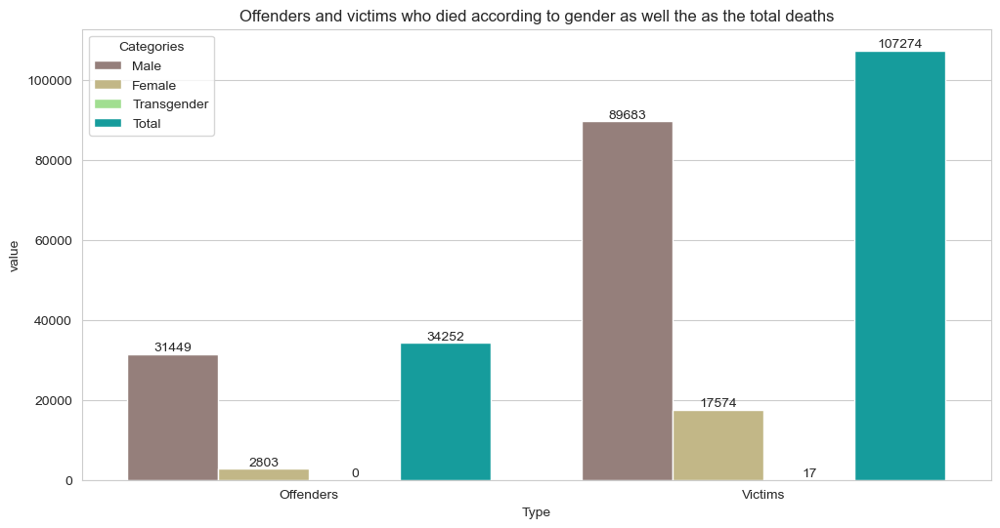

In [405]:
# bar plot created with melt data
fig, ax = plt.subplots(figsize=(12, 6))

sns.set_style('whitegrid')
sns.barplot(data=df1_main_melt,x='Type', y='value', hue='Categories', palette='terrain_r')
plt.title("Offenders and victims who died according to gender as well the as the total deaths")

for container in ax.containers:
    ax.bar_label(container)

plt.show()

##  Q5. Percentage of Deaths occurring due to non-wearing of helmets between male and female. 

In [406]:
df2_Male = df2.iloc[-1,3] # slicing the original data frameand saving it to a new variable
df2_Female = df2.iloc[-1,4]

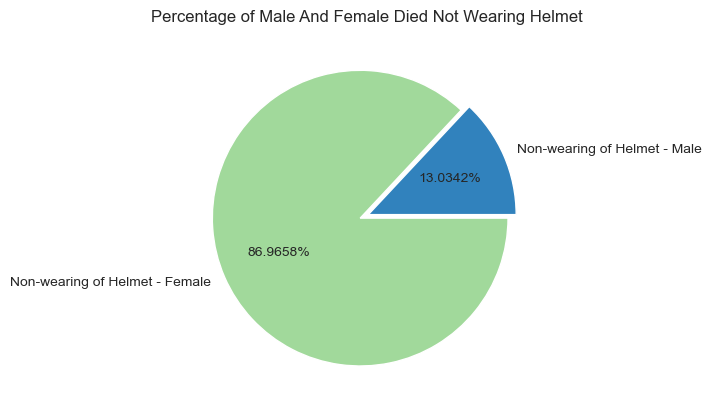

In [407]:
x = [df2_Male,df2_Female] # data for the pie chart
y = ['Non-wearing of Helmet - Male',
    'Non-wearing of Helmet - Female']
plt.title("Percentage of Male And Female Died Not Wearing Helmet")
outer_colors = plt.get_cmap("tab20c")(np.arange(8) * 10)
plt.pie(x, labels=y, explode = (0.01,0.05), autopct='%1.4f%%', colors=outer_colors)
plt.show()

##  Q6.	The number of accidents happening per state from the year 2003 to 2016.

In [408]:
df3_cut = df3[df3['States/Uts']!='All India'] # slicing the original data frameand saving it to a new variable
df3_cut.columns = ['States/Uts', '2003', '2004', '2005', '2006', '2007',
                   '2008', '2009', '2010', '2011', '2012',
                   '2013', '2014', '2015', '2016']

#### Replacing the Nan Values with median. 

In [409]:
for count, collumn in enumerate(df3_cut):
    if count>=1:
        df3_cut[f'{collumn}'] = df3_cut[f'{collumn}'].replace(np.nan,df3_cut[f'{collumn}'].median())

#### Unpivot the above data frame with the help of melt function

In [410]:
df3_melt = df3_cut.melt(id_vars='States/Uts', value_vars=df3_cut.iloc[:0,1:15], var_name='Year', value_name='Total Deaths')

#### Creating Line Chart

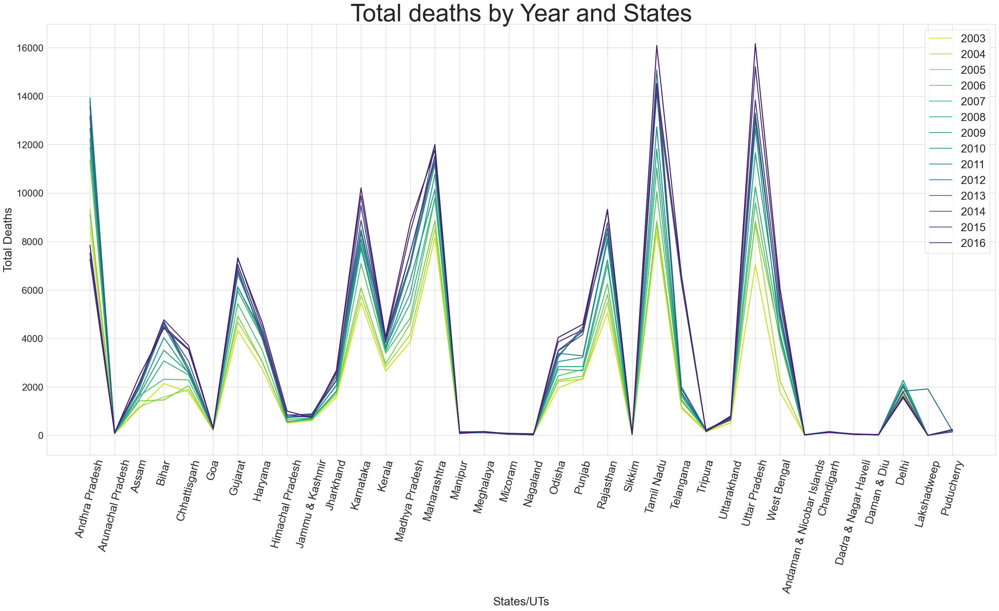

In [411]:
fig, ax = plt.subplots(figsize=(35, 16))
sns.lineplot(data=df3_melt, x='States/Uts', y='Total Deaths',hue='Year', palette='viridis_r', legend='full', lw=2)
plt.title("Total deaths by Year and States", fontsize=50)
plt.xticks(rotation=75, fontsize=23)
plt.yticks(fontsize=20)
plt.xlabel('States/UTs',fontsize=24)
plt.ylabel('Total Deaths',fontsize=24)
plt.legend(loc=1, prop={'size': 23})
plt.show()

## Q7. Number of ACCIDENTS for 1,2,3,4 LANE per 1L population of resp. state. 

In [412]:
df4_data=df4.drop(df4[df4['State/UT']=='Delhi'].index) # slicing and setting into a new variable

df4_accidents = df4_data.filter(regex='Accident - 2014 per 1L people$', axis=1) # filtering the data as per the need
df4_state = df4_data.filter(items=['State/UT'])
df4_lane_accident = pd.concat([df4_state, df4_accidents], axis=1) # concatinating the data frames

# using Melt funtion Unpivot the table
df4_lane_accident_melt = df4_lane_accident.melt(id_vars='State/UT', value_vars=df4_lane_accident[:1:5], var_name='Lanes', value_name='Accidents')

### Plotting the bar Chart. 

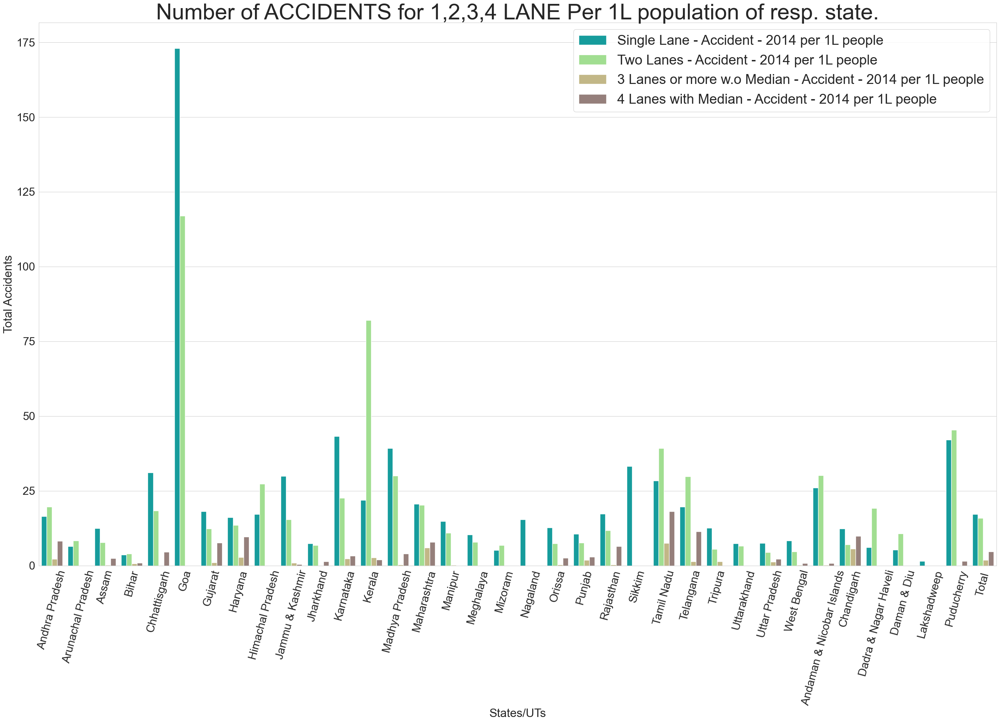

In [413]:
fig, ax = plt.subplots(figsize=(35, 20))
sns.barplot(data=df4_lane_accident_melt, x='State/UT', y='Accidents',hue='Lanes', palette='terrain')
plt.title("Number of ACCIDENTS for 1,2,3,4 LANE Per 1L population of resp. state.", fontsize=45)
plt.xticks(rotation=75, fontsize=23)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=24)
plt.ylabel('Total Accidents',fontsize=24)
plt.legend(loc=1, prop={'size': 28})

plt.show()

## Q8.	Number of people INJURED for 1,2,3,4 type of lane per 1L population of resp. State. 

In [414]:
df4_injured = df4_data.filter(regex='Injured - 2014 per 1L people$', axis=1) # slicing and setting into a new variable

df4_lane_injured = pd.concat([df4_state, df4_injured], axis=1)# concatinating the data frames

# Creating Melt Function
df4_lane_injured_melt = df4_lane_injured.melt(id_vars='State/UT', value_vars=df4_lane_injured[:1:5], var_name='Lanes', value_name='Injured')

#### Plotting Bar Chart 

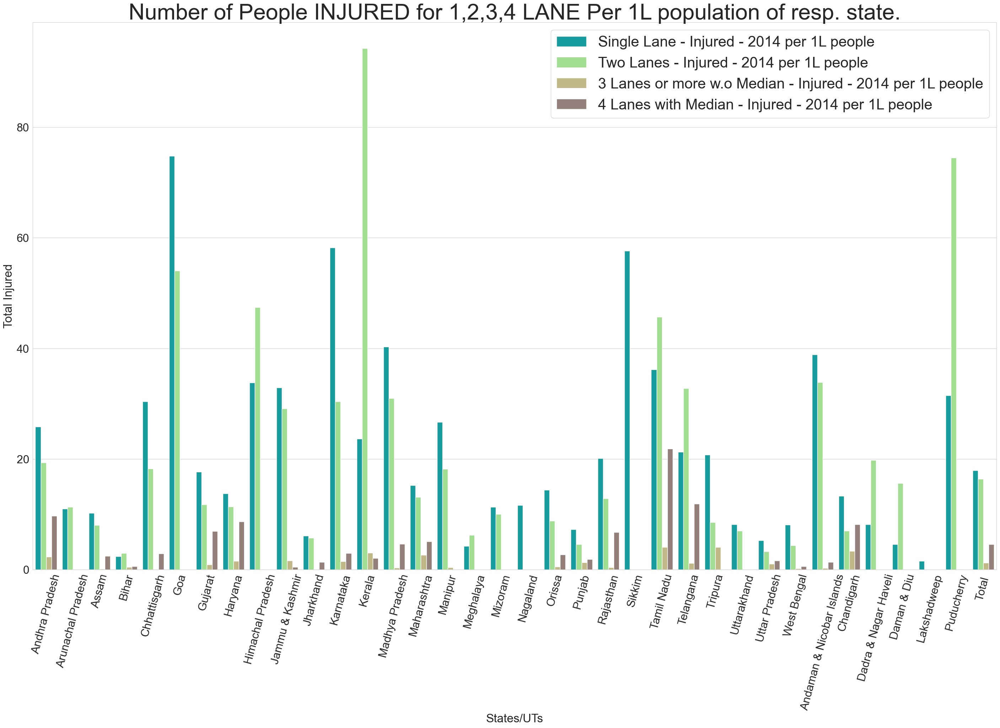

In [415]:
fig, ax = plt.subplots(figsize=(35, 20))
sns.barplot(data=df4_lane_injured_melt, x='State/UT', y='Injured',hue='Lanes', palette='terrain')
plt.title("Number of People INJURED for 1,2,3,4 LANE Per 1L population of resp. state.", fontsize=45)
plt.xticks(rotation=75, fontsize=23)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=24)
plt.ylabel('Total Injured',fontsize=24)
plt.legend(loc=1, prop={'size': 30})

plt.show()

## Q9.	Number of people KILLED for 1,2,3,4 LANES per 1L population of resp. States. 

In [416]:
df4_killed = df4_data.filter(regex='Killed - 2014 per 1L people$', axis=1) # slicing and setting into a new variable

df4_lane_killed = pd.concat([df4_state, df4_killed], axis=1) # concatinating the data frames

# Creating Melt Function
df4_lane_killed_melt = df4_lane_killed.melt(id_vars='State/UT', value_vars=df4_lane_killed[:1:5], var_name='Lanes', value_name='killed')

### Plotting Line Chart 

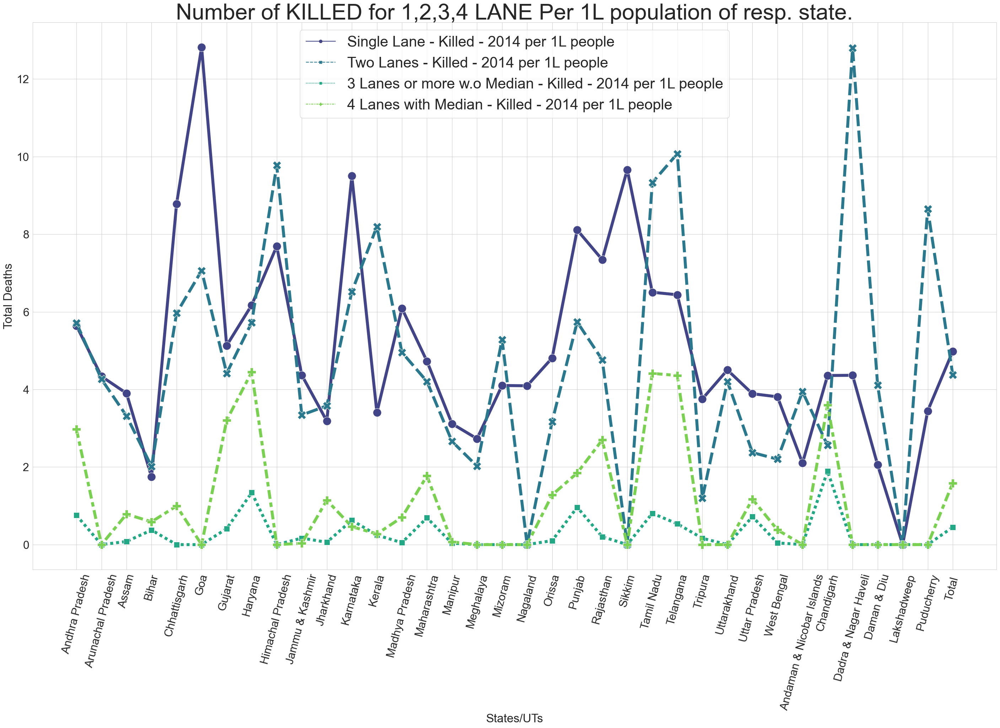

In [417]:
fig, ax = plt.subplots(figsize=(35, 20))
sns.lineplot(data=df4_lane_killed_melt, x='State/UT', y='killed',hue='Lanes', style='Lanes',palette='viridis', markers=True, dashes=True, lw=6, markersize=17)
plt.title("Number of KILLED for 1,2,3,4 LANE Per 1L population of resp. state.", fontsize=45)
plt.xticks(rotation=75, fontsize=23)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=24)
plt.ylabel('Total Deaths',fontsize=24)
plt.legend(loc=9, prop={'size': 30})
plt.plot()

plt.show()

## Q10.	Number of Accidents, people KILLED, INJURED on SINGLE LANE per 1L population. 

In [418]:
df4_single_lane = df4_data.filter(regex='2014 per 1L people$', axis=1).filter(like='Single Lane', axis=1)# slicing and setting into a new variable

df4_single_lane_concat = pd.concat([df4_state, df4_single_lane], axis=1)# concatinating the data frames

# Creating Melt Function
df4_single_lane_concat_melt = df4_single_lane_concat.melt(id_vars='State/UT', value_vars=df4_single_lane_concat.iloc[:,1:4],var_name='Type', value_name='Total')


### Plotting Bar Chart 

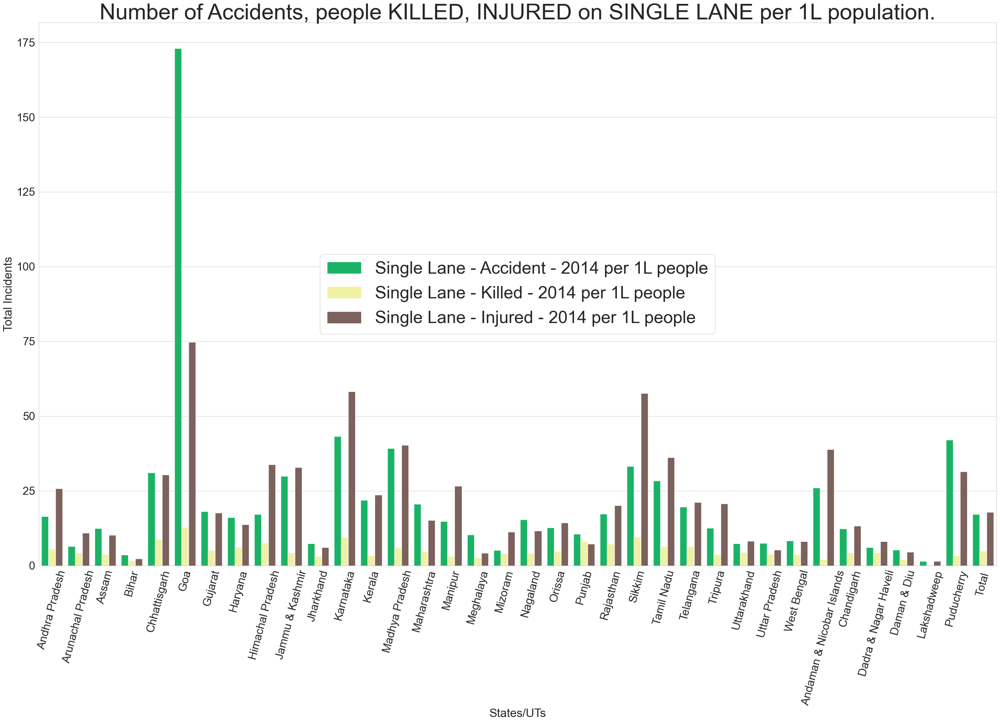

In [419]:
fig, ax = plt.subplots(figsize=(35, 20))
sns.barplot(data=df4_single_lane_concat_melt, x='State/UT', y='Total',hue='Type', palette='terrain')
plt.title("Number of Accidents, people KILLED, INJURED on SINGLE LANE per 1L population.", fontsize=45)
plt.xticks(rotation=75, fontsize=23)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=24)
plt.ylabel('Total Incidents',fontsize=24)
plt.legend(loc=10, prop={'size': 35})

plt.show()

##  Q11. Number of accidents, people INJURED, KILLED on DOUBLE LANE per 1L population.

In [420]:
df4_two_lane = df4_data.filter(regex='2014 per 1L people$', axis=1).filter(like='Two Lanes', axis=1)# slicing and setting into a new variable

df4_two_lane_concat = pd.concat([df4_state, df4_two_lane], axis=1)# concatinating the data frames
# Creating Melt Function
df4_two_lane_concat_melt = df4_two_lane_concat.melt(id_vars='State/UT', value_vars=df4_two_lane_concat.iloc[:,1:4],var_name='Incident Type', value_name='Total')

## Plotting Bar chart 

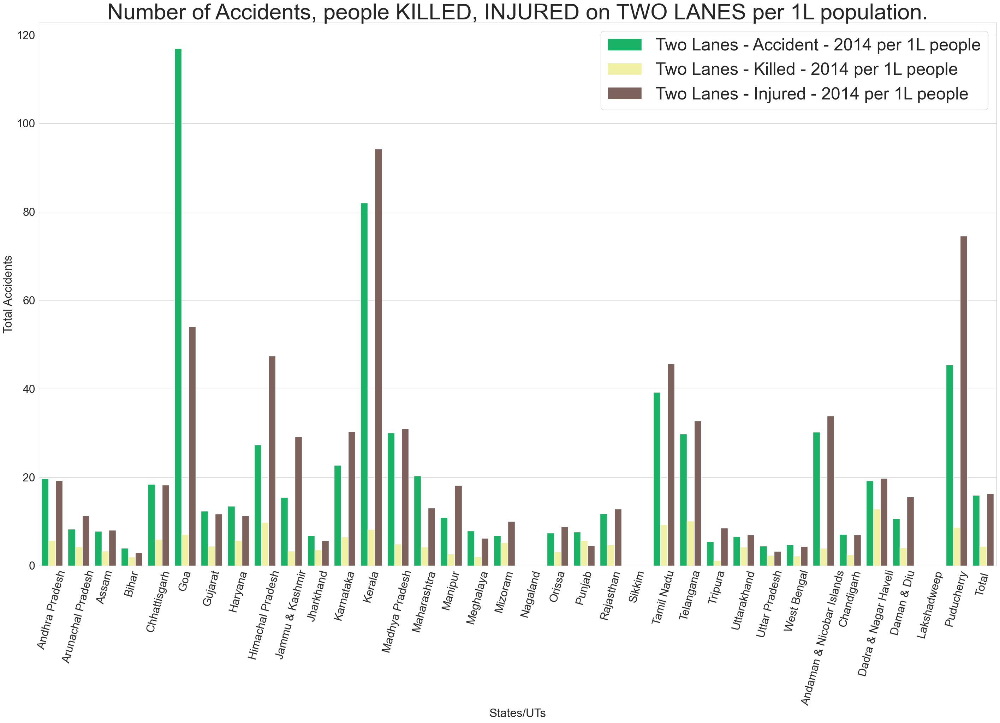

In [421]:
fig, ax = plt.subplots(figsize=(35, 20))
sns.barplot(data=df4_two_lane_concat_melt, x='State/UT', y='Total',hue='Incident Type', palette='terrain')
plt.title("Number of Accidents, people KILLED, INJURED on TWO LANES per 1L population.", fontsize=45)
plt.xticks(rotation=75, fontsize=23)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=24)
plt.ylabel('Total Accidents',fontsize=24)
plt.legend(loc=1, prop={'size': 35})

plt.show()

## 12. Number of accidents, people INJURED, KILLED on THREE LANE per 1L population. 

In [422]:
df4_three_lane = df4_data.filter(regex='2014 per 1L people$', axis=1).filter(like='3 Lanes', axis=1)# slicing and setting into a new variable

df4_three_lane_concat = pd.concat([df4_state, df4_three_lane], axis=1)# concatinating the data frames

# Creating Melt Function
df4_three_lane_concat_melt = df4_three_lane_concat.melt(id_vars='State/UT', value_vars=df4_three_lane_concat.iloc[:,1:4],var_name='Incident Type', value_name='Total')


### Plotting The Bar Chart 

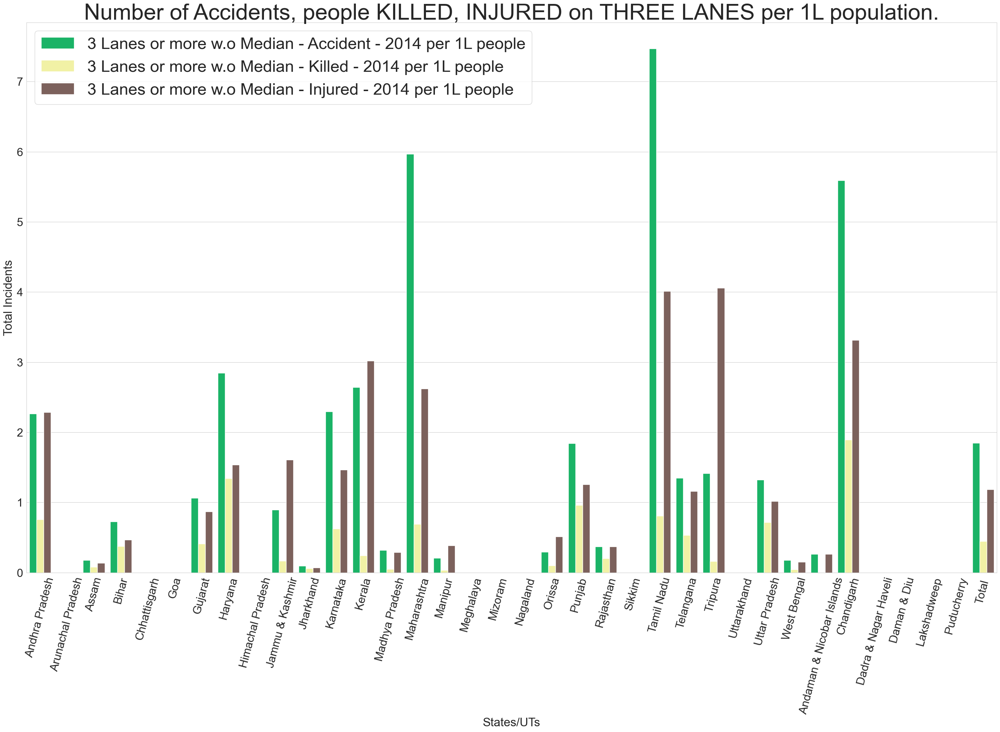

In [423]:
fig, ax = plt.subplots(figsize=(35, 20))
sns.barplot(data=df4_three_lane_concat_melt, x='State/UT', y='Total',hue='Incident Type', palette='terrain')
plt.title("Number of Accidents, people KILLED, INJURED on THREE LANES per 1L population.", fontsize=45)
plt.xticks(rotation=75, fontsize=23)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=24)
plt.ylabel('Total Incidents',fontsize=24)
plt.legend(loc=2, prop={'size': 33})

plt.show()

## Q13.	Number of accidents, people INJURED, KILLED on FOUR LANE per 1L population.

In [424]:
df4_four_lane = df4_data.filter(regex='2014 per 1L people$', axis=1).filter(like='4 Lanes', axis=1)# slicing and setting into a new variable

df4_four_lane_concat = pd.concat([df4_state, df4_four_lane], axis=1)# concatinating the data frames

# Using melt function
df4_four_lane_concat_melt = df4_four_lane_concat.melt(id_vars='State/UT', value_vars=df4_four_lane_concat.iloc[:,1:4],var_name='Incident Type', value_name='Total')


### Plotting The Bar Chart

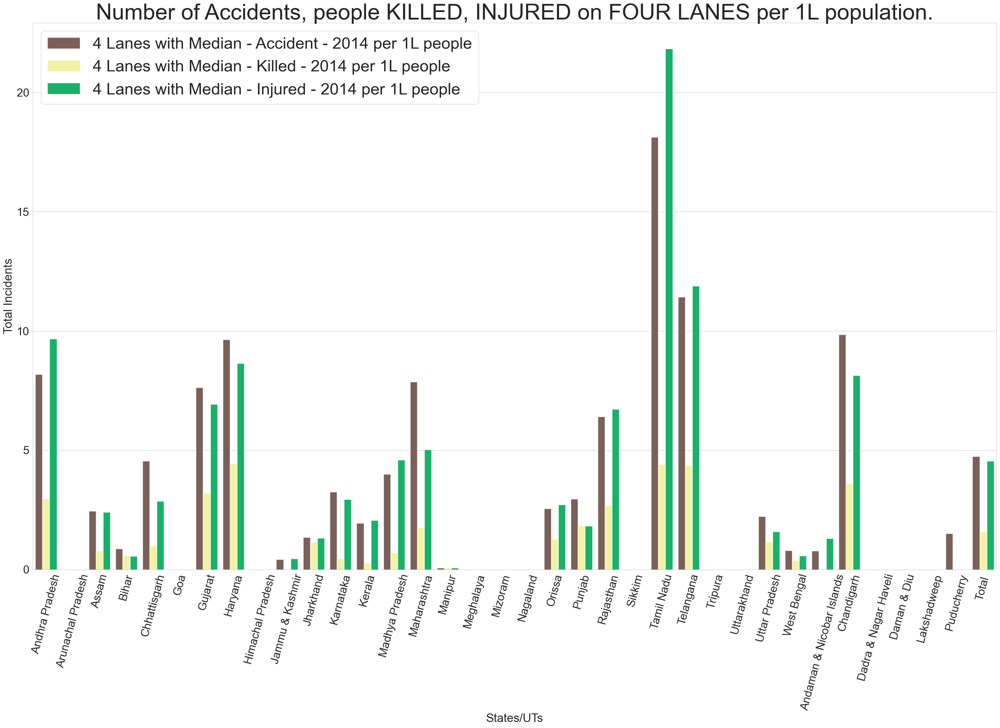

In [425]:
fig, ax = plt.subplots(figsize=(35, 20))
sns.barplot(data=df4_four_lane_concat_melt, x='State/UT', y='Total',hue='Incident Type', palette='terrain_r')
plt.title("Number of Accidents, people KILLED, INJURED on FOUR LANES per 1L population.", fontsize=45)
plt.xticks(rotation=75, fontsize=23)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=24)
plt.ylabel('Total Incidents',fontsize=24)
plt.legend(loc=2, prop={'size': 33})

plt.show()

## Q14. Total Number of INJURED, KILLED, ROAD ACCIDENTS irrespective of lanes per 1L population of resp. State.

In [426]:
df4_total_all = df4_data # Creating a new Variable

# filtering data as per need
df4_total_all['Accident-2014'] = df4_data.filter(regex='Accident - 2014 per 1L people$',axis=1).sum(axis=1)
df4_total_all['Killed-2014'] = df4_data.filter(regex='Killed - 2014 per 1L people$',axis=1).sum(axis=1)
df4_total_all['Injured-2014'] = df4_data.filter(regex='Injured - 2014 per 1L people$',axis=1).sum(axis=1)

# using melt function
df4_total_all_melt = df4_total_all.melt(id_vars='State/UT',value_vars=df4_total_all.iloc[:,-3:], var_name='Type Of Incident', value_name='Total Incidents')


### Plotting Bar Chart 

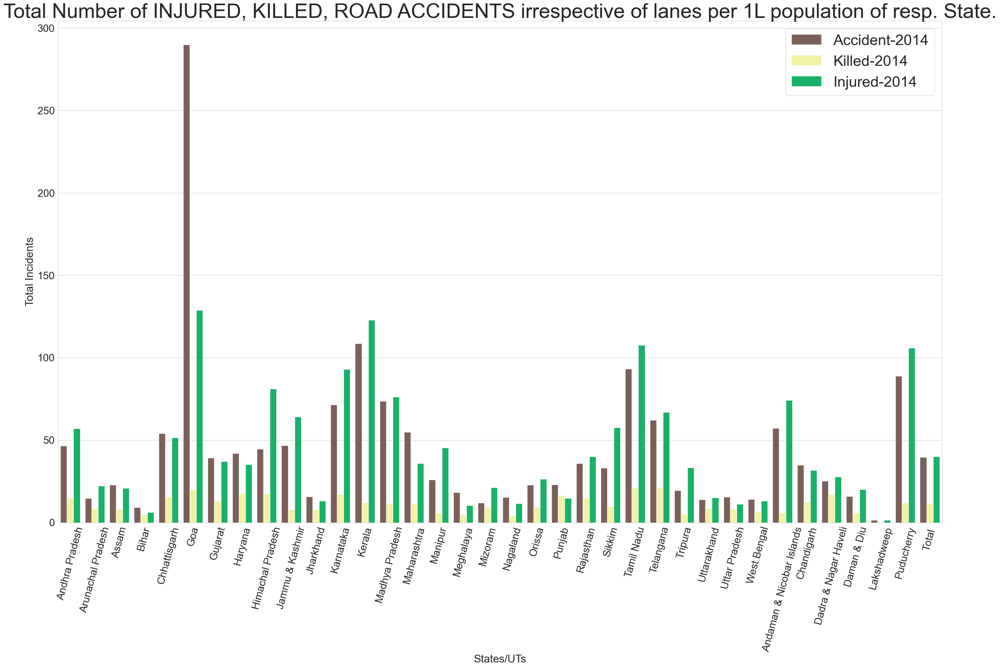

In [427]:
fig, ax = plt.subplots(figsize=(35, 20))
sns.barplot(data=df4_total_all_melt, x='State/UT', y='Total Incidents',hue='Type Of Incident', palette='terrain_r')
plt.title("Total Number of INJURED, KILLED, ROAD ACCIDENTS irrespective of lanes per 1L population of resp. State.", fontsize=45)
plt.xticks(rotation=75, fontsize=23)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=24)
plt.ylabel('Total Incidents',fontsize=24)
plt.legend(loc=1, prop={'size': 33})

plt.show()

## Q15. Number of people KILLED for each different REASON per 1L population of that state.

In [428]:
df5_data=df5.replace(np.nan,0) # setting nan values to 0
df5_state_Killed = df5_data[['States/UTs']] # slicing and setting it to a variable
df5_state_Killed = pd.concat([df5_state_Killed,df5_data.filter(regex='Killed - 2014 per 1L people')],axis=1)# Concating Data Frames

# updating collumn names
df5_collumn_name = ['States/UTs','Fault of Driver','Fault of Drive of Other Vehicles','Fault of Pedistrian','Defect in Condition of Motor Vehicle',
                    'Defect in Road Condition','Weather Condition',
                    'Fault of Passenger','Poor Light','Falling of Boulders','other Causes']

df5_state_Killed.columns = df5_collumn_name

# Melt Function
df5_state_Killed_melt = df5_state_Killed.melt(id_vars='States/UTs', value_vars=df5_state_Killed.iloc[:,1:], var_name='Fault/Reason', value_name='Total Killed')

### Plotting bar charts

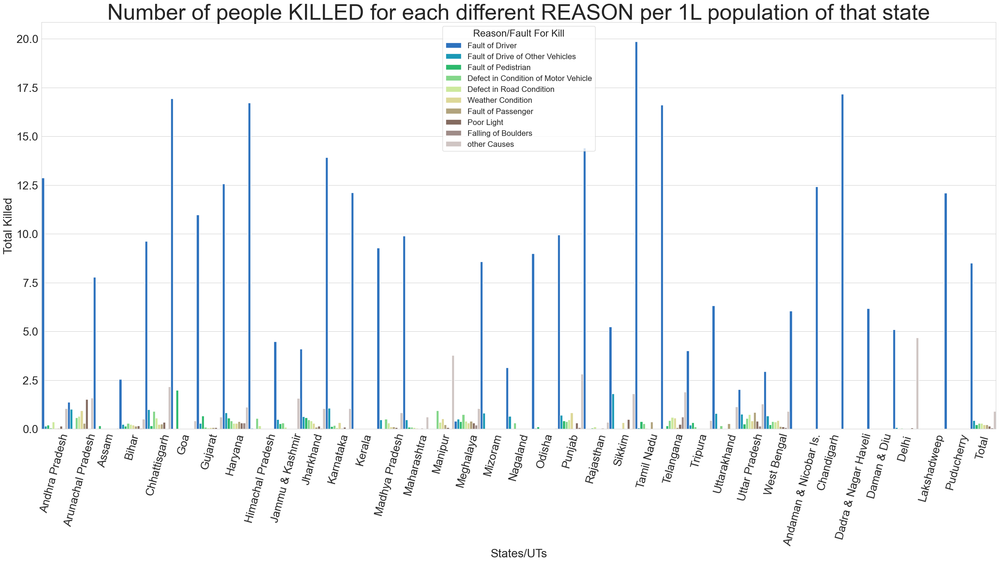

In [429]:
fig, ax = plt.subplots(figsize=(35, 15))
sns.barplot(data=df5_state_Killed_melt, x='States/UTs', y='Total Killed',hue='Fault/Reason', palette='terrain',width=1)
plt.title("Number of people KILLED for each different REASON per 1L population of that state", fontsize=45)
plt.xticks(rotation=75, fontsize=23)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=24)
plt.ylabel('Total Killed',fontsize=24)
plt.legend(loc=9, prop={'size': 16},title='Reason/Fault For Kill', title_fontsize=20)
plt.show()

## Q16.	Number of people INJURED for each reason per 1L people of that state.

In [430]:
df5_state_Injured = df5_data[['States/UTs']]# slicing and setting it to a variable

# concating data frames
df5_state_Injured = pd.concat([df5_state_Injured,df5_data.filter(regex='Injured - 2014 per 1L people')],axis=1)

#updating Column Name
df5_state_Injured.columns = df5_collumn_name

# melt function
df5_state_Injured_melt = df5_state_Injured.melt(id_vars='States/UTs', value_vars=df5_state_Killed.iloc[:,1:], var_name='Fault/Reason', value_name='Total Injured')

### Plotting bar Chart 

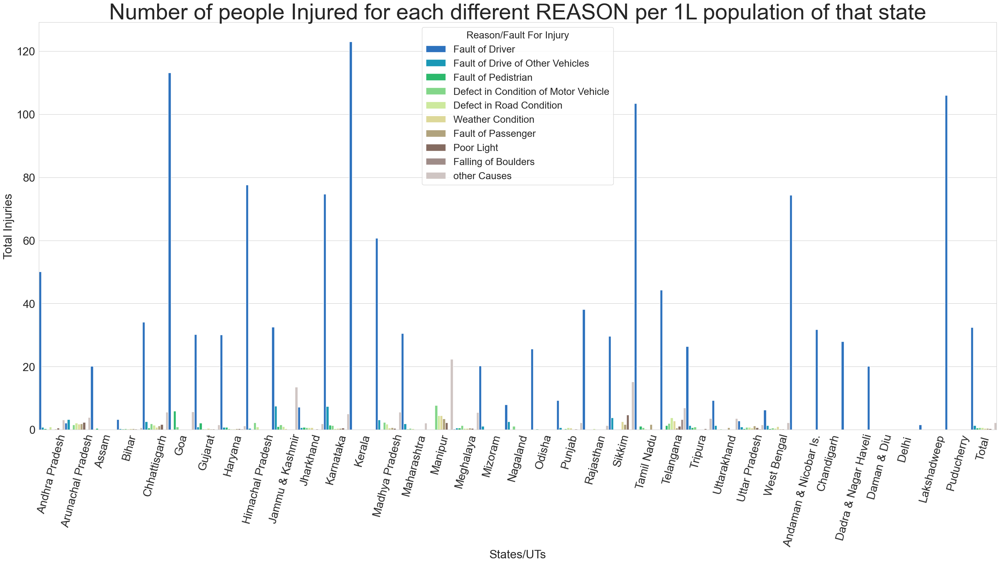

In [431]:
fig, ax = plt.subplots(figsize=(35, 15))
sns.barplot(data=df5_state_Injured_melt, x='States/UTs', y='Total Injured',hue='Fault/Reason', palette='terrain',width=1)
plt.title("Number of people Injured for each different REASON per 1L population of that state", fontsize=45)
plt.xticks(rotation=75, fontsize=23)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=24)
plt.ylabel('Total Injuries',fontsize=24)
plt.legend(loc=9, prop={'size': 20},title='Reason/Fault For Injury', title_fontsize=20)
plt.show()

## Q17. Number of ACCIDENTS for each reason per 1L people of that state.

In [432]:
df5_state_Accident = df5_data[['States/UTs']] #slicing States

#Concat Data
df5_state_Accident = pd.concat([df5_state_Accident,df5_data.filter(regex='Accidents - 2014 per 1L people')],axis=1)

#Updating Column Name
df5_state_Accident.columns = df5_collumn_name

#Melt Function
df5_state_Accident_melt = df5_state_Accident.melt(id_vars='States/UTs', value_vars=df5_state_Killed.iloc[:,1:], var_name='Fault/Reason', value_name='Total Accident')


### Plotting bar Chart 

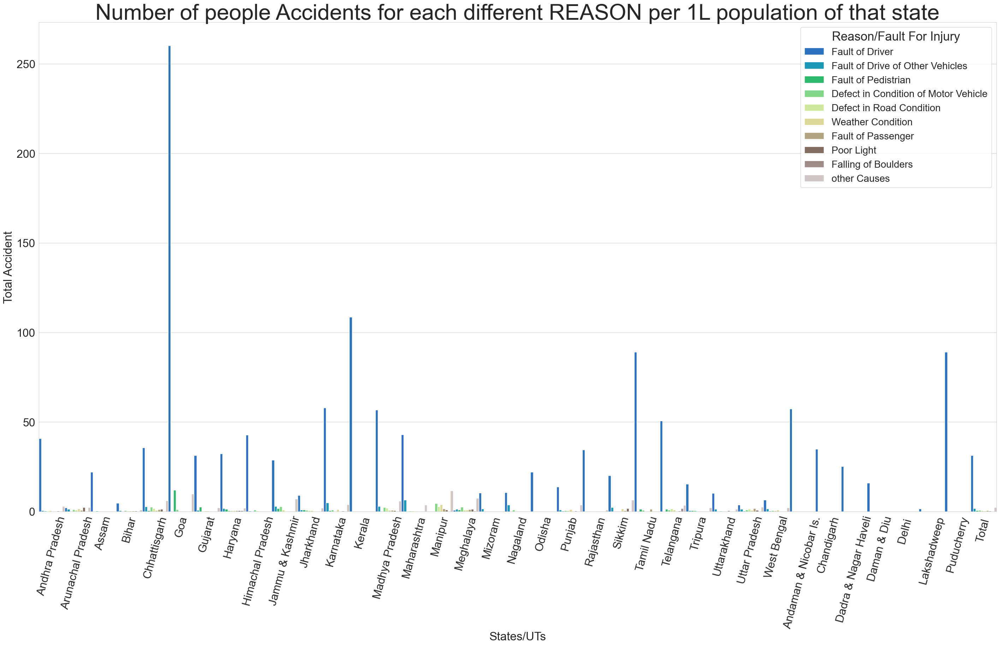

In [433]:
fig, ax = plt.subplots(figsize=(35, 18))
sns.barplot(data=df5_state_Accident_melt, x='States/UTs', y='Total Accident',hue='Fault/Reason', palette='terrain',width=1)
plt.title("Number of people Accidents for each different REASON per 1L population of that state", fontsize=45)
plt.xticks(rotation=75, fontsize=23)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=24)
plt.ylabel('Total Accident',fontsize=24)
plt.legend(loc=1, prop={'size': 20},title='Reason/Fault For Injury', title_fontsize=25)
plt.show()

## Q18. Total number of ROAD ACCIDENTS, INJURIES, DEATHS due to FAULT OF THE DRIVER per 1L population of that state.

In [434]:
df5_state_driver = df5_data[['States/UTs']] #slicing state data

#filtering data as per need
df5_driver_fault = df5_data.filter(regex='Fault of Driver-',axis=1).filter(regex='2014 per 1L people$',axis=1)
df5_driver_fault = pd.concat([df5_state_driver,df5_driver_fault],axis=1) # concat data frames

#Update collumns
df5_Incident_Name = ['States/UTs','Accidents','Killed','Injured']

df5_driver_fault.columns = df5_Incident_Name

# Melt Function
df5_driver_fault_melt = df5_driver_fault.melt(id_vars='States/UTs', value_vars=df5_driver_fault.iloc[:,1:], var_name='Incident Type', value_name='Incident Count')

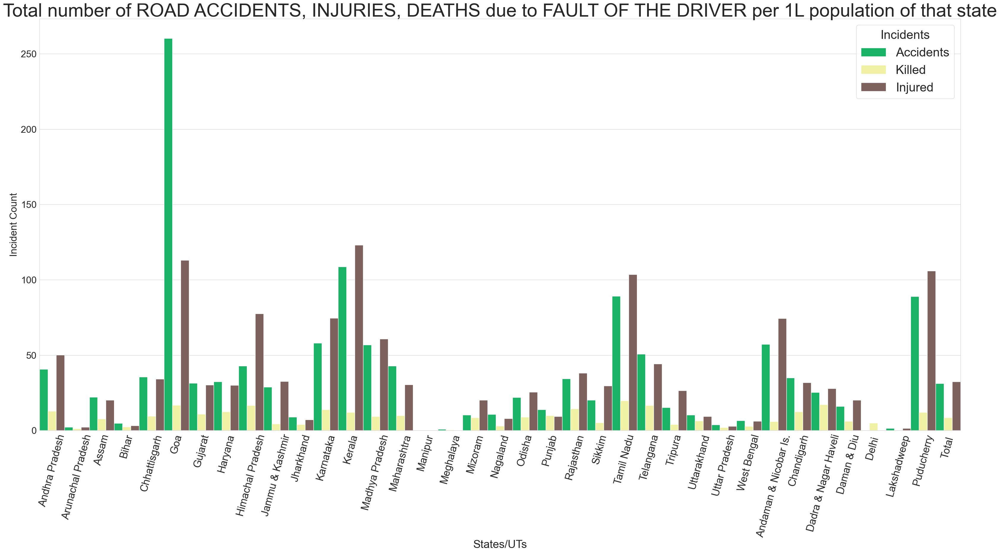

In [435]:
fig, ax = plt.subplots(figsize=(40, 18))
sns.barplot(data=df5_driver_fault_melt, x='States/UTs', y='Incident Count',hue='Incident Type', palette='terrain',width=1)
plt.title("Total number of ROAD ACCIDENTS, INJURIES, DEATHS due to FAULT OF THE DRIVER per 1L population of that state", fontsize=45)
plt.xticks(rotation=75, fontsize=25)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=27)
plt.ylabel('Incident Count',fontsize=24)
plt.legend(loc=1, prop={'size': 30},title='Incidents', title_fontsize=30)
plt.show()

## Q19. Total number of ROAD ACCIDENTS, INJURIES, DEATHS due to the FAULT OF DRIVER'S FROM OTHER VEHICLES per 1L people of that state. 

In [436]:
df5_state_driver = df5_data[['States/UTs']] #slicing State data

# filtering data as per need
df5_other_driver_fault = df5_data.filter(regex='Fault of Driver of other vehicles-',axis=1).filter(regex='2014 per 1L people$',axis=1)

# concat dataframe
df5_other_driver_fault = pd.concat([df5_state_driver,df5_other_driver_fault],axis=1)

# updating Column names
df5_Incident_Name = ['States/UTs','Accidents','Killed','Injured']

df5_other_driver_fault.columns = df5_Incident_Name

# Melt function
df5_other_driver_fault_melt = df5_other_driver_fault.melt(id_vars='States/UTs', value_vars=df5_other_driver_fault.iloc[:,1:], var_name='Incident Type', value_name='Incident Count')


### Plotting The Bar Plot 

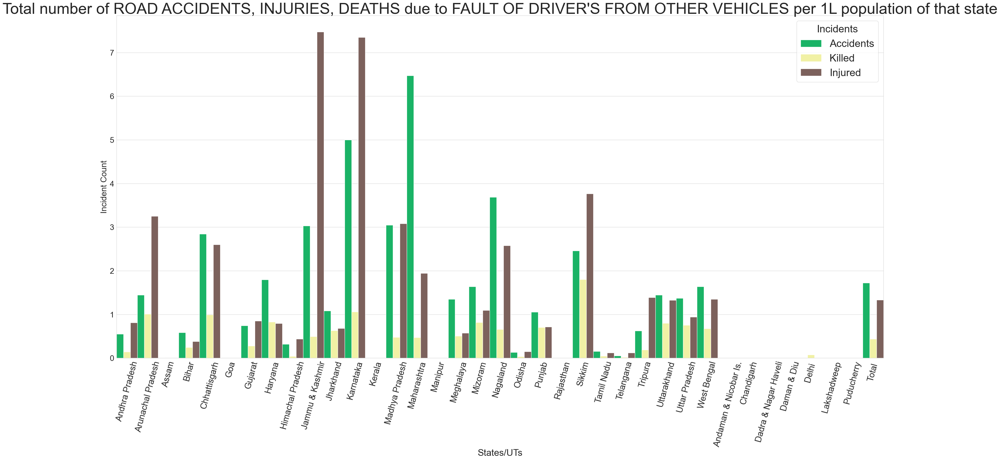

In [437]:
fig, ax = plt.subplots(figsize=(40, 18))
sns.barplot(data=df5_other_driver_fault_melt, x='States/UTs', y='Incident Count',hue='Incident Type', palette='terrain',width=1)
plt.title("Total number of ROAD ACCIDENTS, INJURIES, DEATHS due to FAULT OF DRIVER'S FROM OTHER VEHICLES per 1L population of that state", fontsize=45)
plt.xticks(rotation=75, fontsize=25)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=27)
plt.ylabel('Incident Count',fontsize=24)
plt.legend(loc=1, prop={'size': 30},title='Incidents', title_fontsize=30)
plt.show()

## Q20. Total number of ROAD ACCIDENTS, INJURIES, DEATHS due to the FAULT OF PEDESTRIANS per 1L people of that state 

In [438]:
df5_state_driver = df5_data[['States/UTs']] # slicing The State Collumn

# Filter the collumns as per the need
df5_Pedestrian_fault = df5_data.filter(regex='Fault of Pedestrian-',axis=1).filter(regex='2014 per 1L people$',axis=1)

#concating the data frames
df5_Pedestrian_fault = pd.concat([df5_state_driver,df5_Pedestrian_fault],axis=1)

#updating the column names
df5_Incident_Name = ['States/UTs','Accidents','Killed','Injured']

df5_Pedestrian_fault.columns = df5_Incident_Name

# using melt function
df5_Pedestrian_fault_melt = df5_Pedestrian_fault.melt(id_vars='States/UTs', value_vars=df5_Pedestrian_fault.iloc[:,1:], var_name='Incident Type', value_name='Incident Count')


### Plotting the Bar Chart 

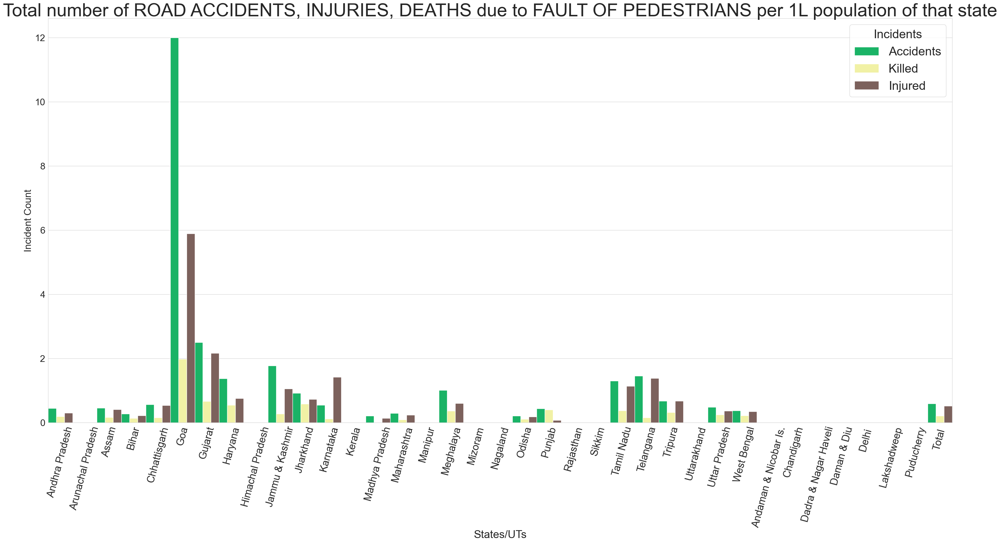

In [439]:
fig, ax = plt.subplots(figsize=(40, 18))
sns.barplot(data=df5_Pedestrian_fault_melt, x='States/UTs', y='Incident Count',hue='Incident Type', palette='terrain',width=1)
plt.title("Total number of ROAD ACCIDENTS, INJURIES, DEATHS due to FAULT OF PEDESTRIANS per 1L population of that state", fontsize=45)
plt.xticks(rotation=75, fontsize=25)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=27)
plt.ylabel('Incident Count',fontsize=24)
plt.legend(loc=1, prop={'size': 30},title='Incidents', title_fontsize=30)
plt.show()

## Q21. Total number of ROAD ACCIDENTS, INJURIES, DEATHS due to the DEFECTS IN THE VEHICLE per 1L people of that state. 

In [440]:
df5_state_driver = df5_data[['States/UTs']]# slicing states 

#filtering data as per the need
df5_Vehicle_fault = df5_data.filter(regex='Defect in Condition of Motor Vehicle-',axis=1).filter(regex='2014 per 1L people$',axis=1)

#concat data frames
df5_Vehicle_fault = pd.concat([df5_state_driver,df5_Vehicle_fault],axis=1)

#updating column names
df5_Incident_Name = ['States/UTs','Accidents','Killed','Injured']

df5_Vehicle_fault.columns = df5_Incident_Name

#melt function to unpivot data frame
df5_Vehicle_fault_melt = df5_Vehicle_fault.melt(id_vars='States/UTs', value_vars=df5_Vehicle_fault.iloc[:,1:], var_name='Incident Type', value_name='Incident Count')


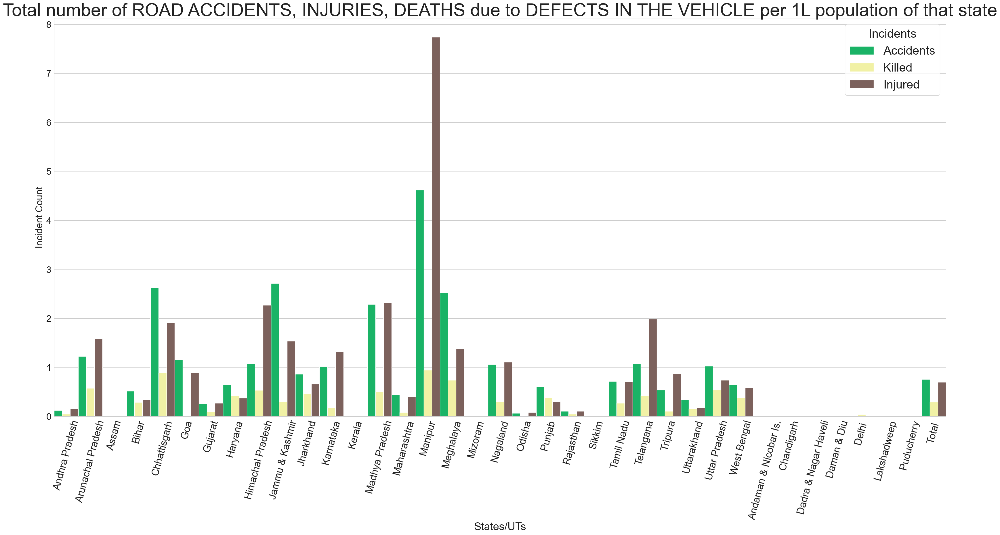

In [441]:
fig, ax = plt.subplots(figsize=(40, 18))
sns.barplot(data=df5_Vehicle_fault_melt, x='States/UTs', y='Incident Count',hue='Incident Type', palette='terrain',width=1)
plt.title("Total number of ROAD ACCIDENTS, INJURIES, DEATHS due to DEFECTS IN THE VEHICLE per 1L population of that state", fontsize=45)
plt.xticks(rotation=75, fontsize=25)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=27)
plt.ylabel('Incident Count',fontsize=24)
plt.legend(loc=1, prop={'size': 30},title='Incidents', title_fontsize=30)
plt.show()

## Q22. Total number of ROAD ACCIDENTS, INJURIES, DEATHS due to DEFECTS IN THE ROAD CONDITION per 1L people of that state.

In [442]:
df5_state_driver = df5_data[['States/UTs']] # slicing the states data

#filtering data as per need
df5_Road_fault = df5_data.filter(regex='Defect in Road Condition-',axis=1).filter(regex='2014 per 1L people$',axis=1)

#concating the data
df5_Road_fault = pd.concat([df5_state_driver,df5_Road_fault],axis=1)

#Updating Collumn names
df5_Incident_Name = ['States/UTs','Accidents','Killed','Injured']

df5_Road_fault.columns = df5_Incident_Name

#melt function to unpivot data
df5_Road_fault_melt = df5_Road_fault.melt(id_vars='States/UTs', value_vars=df5_Road_fault.iloc[:,1:], var_name='Incident Type', value_name='Incident Count')


### Plotting the Bar chart 

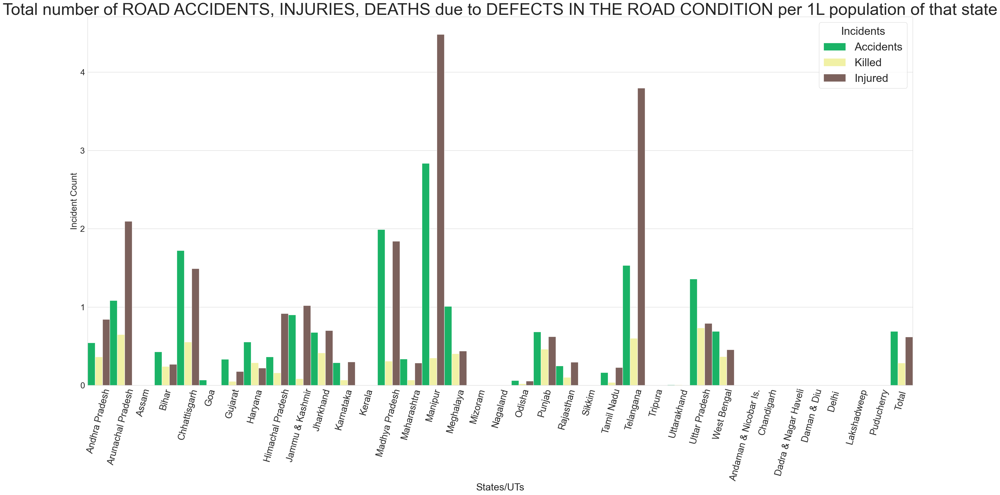

In [443]:
fig, ax = plt.subplots(figsize=(40, 18))
sns.barplot(data=df5_Road_fault_melt, x='States/UTs', y='Incident Count',hue='Incident Type', palette='terrain',width=1)
plt.title("Total number of ROAD ACCIDENTS, INJURIES, DEATHS due to DEFECTS IN THE ROAD CONDITION per 1L population of that state", fontsize=45)
plt.xticks(rotation=75, fontsize=25)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=27)
plt.ylabel('Incident Count',fontsize=24)
plt.legend(loc=1, prop={'size': 30},title='Incidents', title_fontsize=30)
plt.show()

## Q23.	Total number of ROAD ACCIDENTS, INJURIES, DEATHS due to WEATHER CONDITION per 1L people of that state. 

In [444]:
df5_state_driver = df5_data[['States/UTs']] #slicing the states data

#filtering the data as per need
df5_Weather_fault = df5_data.filter(regex='Weather Condition-',axis=1).filter(regex='2014 per 1L people$',axis=1)

#concat data frames
df5_Weather_fault = pd.concat([df5_state_driver,df5_Weather_fault],axis=1)

#updating Collumn names
df5_Incident_Name = ['States/UTs','Accidents','Killed','Injured']

df5_Weather_fault.columns = df5_Incident_Name

#melt function
df5_Weather_fault_melt = df5_Weather_fault.melt(id_vars='States/UTs', value_vars=df5_Weather_fault.iloc[:,1:], var_name='Incident Type', value_name='Incident Count')


### Plotting bar Chart

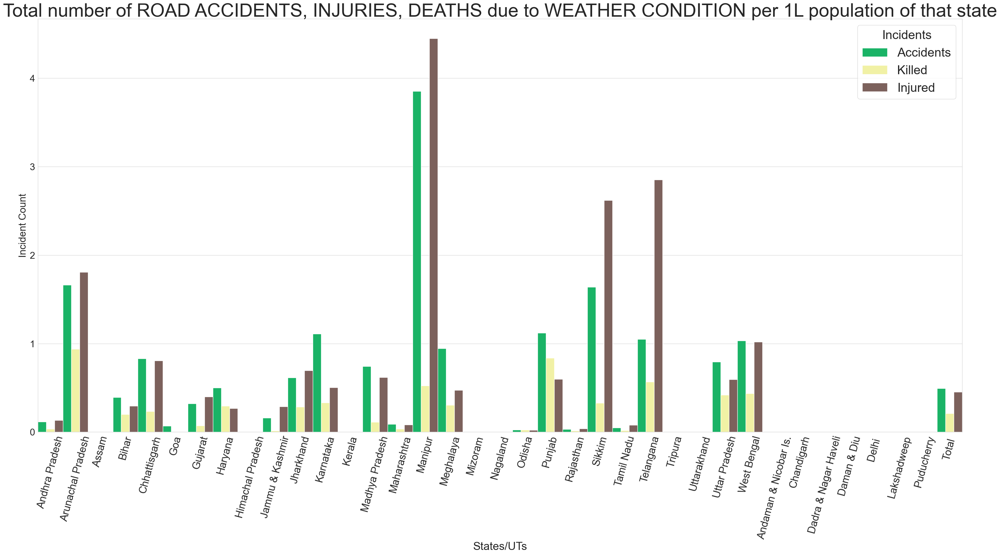

In [445]:
fig, ax = plt.subplots(figsize=(40, 18))
sns.barplot(data=df5_Weather_fault_melt, x='States/UTs', y='Incident Count',hue='Incident Type', palette='terrain',width=1)
plt.title("Total number of ROAD ACCIDENTS, INJURIES, DEATHS due to WEATHER CONDITION per 1L population of that state", fontsize=45)
plt.xticks(rotation=75, fontsize=25)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=27)
plt.ylabel('Incident Count',fontsize=24)
plt.legend(loc=1, prop={'size': 30},title='Incidents', title_fontsize=30)
plt.show()

## Q24.	Number of Total Accidents for each vehicle type per 1L people of that state.

In [446]:
df6_data = df6 #slicing data
df6_Vehicle_State = df6_data[['States/UTs']] #slicing states data

#concat data frames
df6_Vehicle_State_Accidents = pd.concat([df6_Vehicle_State,df6_data.filter(regex='Accidents - Total - 2014 per 1L people$',axis=1)],axis=1)

#Update collumn names
df6_Vehicle_Type = ['States/UTs','Two Wheelers','Auto-Rickshaws','Cars,Jeeps,Taxis','Buses','Trucks,Tempos,MAVs,Tractors','Other Motor Vehicles','Other Vehicles/Objects']

df6_Vehicle_State_Accidents.columns = df6_Vehicle_Type

# melt Function
df6_Vehicle_State_Accidents_melt = df6_Vehicle_State_Accidents.melt(id_vars='States/UTs', value_vars=df6_Vehicle_State_Accidents.iloc[:,1:], var_name='Type Of Vehicle', value_name='Total Accidents')


### Plotting bar Chart

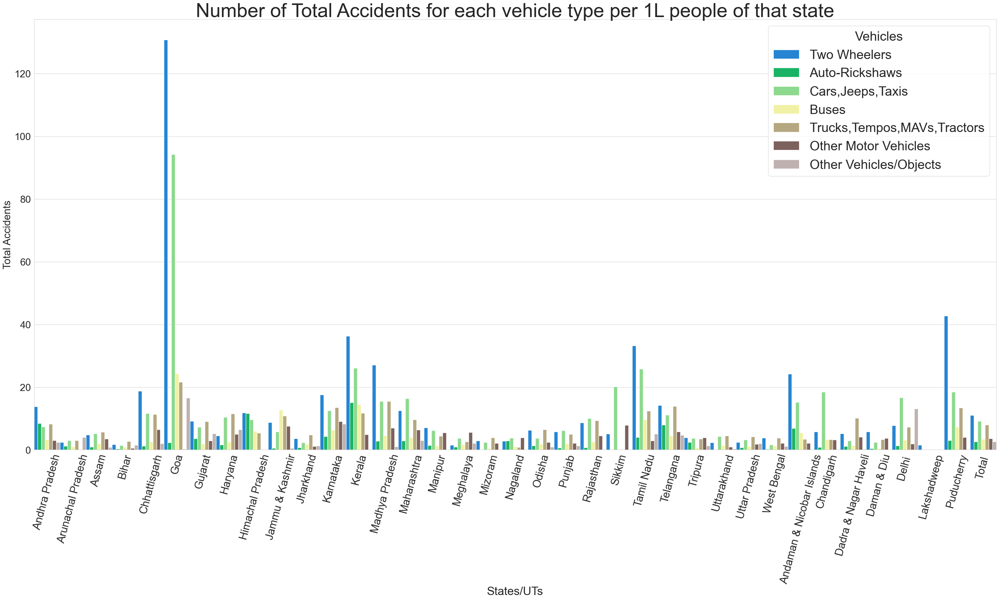

In [447]:
fig, ax = plt.subplots(figsize=(40, 18))
sns.barplot(data=df6_Vehicle_State_Accidents_melt, x='States/UTs', y='Total Accidents',hue='Type Of Vehicle', palette='terrain',width=1)
plt.title("Number of Total Accidents for each vehicle type per 1L people of that state", fontsize=45)
plt.xticks(rotation=75, fontsize=25)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=27)
plt.ylabel('Total Accidents',fontsize=24)
plt.legend(loc=1, prop={'size': 30},title='Vehicles', title_fontsize=30)
plt.show()

## Q25.	Number of Persons Killed for each vehicle type per 1L people of that state.

In [448]:
#concat the data Frames
df6_Vehicle_State_Killed = pd.concat([df6_Vehicle_State,df6_data.filter(regex='Killed - 2014 per 1L people$',axis=1)],axis=1)

#update columns
df6_Vehicle_Type = ['States/UTs','Two Wheelers','Auto-Rickshaws','Cars,Jeeps,Taxis','Buses','Trucks,Tempos,MAVs,Tractors','Other Motor Vehicles','Other Vehicles/Objects']

df6_Vehicle_State_Killed.columns = df6_Vehicle_Type

# melt Function
df6_Vehicle_State_Killed_melt = df6_Vehicle_State_Killed.melt(id_vars='States/UTs', value_vars=df6_Vehicle_State_Killed.iloc[:,1:], var_name='Type Of Vehicle', value_name='Total Accidents')


### Plotting box plot

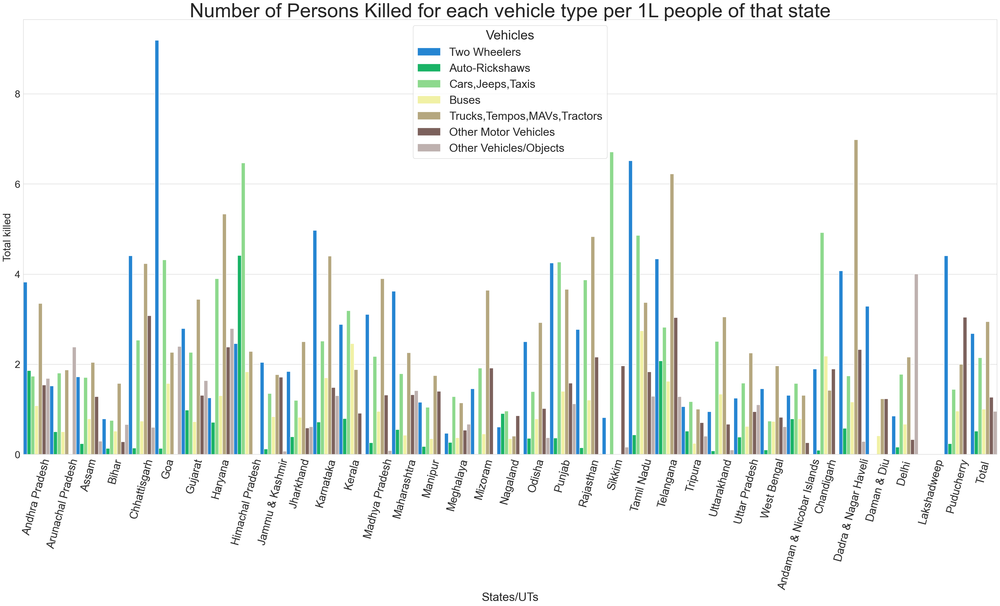

In [449]:
fig, ax = plt.subplots(figsize=(40, 18))
sns.barplot(data=df6_Vehicle_State_Killed_melt, x='States/UTs', y='Total Accidents',hue='Type Of Vehicle', palette='terrain', width=1)
plt.title("Number of Persons Killed for each vehicle type per 1L people of that state", fontsize=45)
plt.xticks(rotation=75, fontsize=25)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=27)
plt.ylabel('Total killed',fontsize=24)
plt.legend(loc=9, prop={'size': 26},title='Vehicles', title_fontsize=30)
plt.show()

## Q26.	Total accidents, fatal accidents, killed and injured for each state per 1L people of that state. 

In [450]:
# slicing the data as per use
df6_data = df6

# for loop for getting the sum of all the total incidents
keys = df6.keys()
values = []
for i in range(3,10,2):
    titles = []
    for j in range(i,len(keys),6):
        titles.append(keys[j])
    values.append(df6_data[titles].sum(axis=1))
    titles.clear()


In [451]:
# creating a panda data frame to store the total values of incidents
df6_incidents = pd.DataFrame(data={'Fatal Accidents':values[0],
                                  'Total Accidents':values[1],
                                  'Persons killed':values[2],
                                  'Persons Injured':values[3]}, columns=['Fatal Accidents','Total Accidents','Persons killed','Persons Injured'])

#concat Data Frames
df6_incidents_total = pd.concat([df6_Vehicle_State,df6_incidents],axis=1)

#melt function for unpivot data frame
df6_incidents_total_melt = df6_incidents_total.melt(id_vars='States/UTs',value_vars=df6_incidents_total.iloc[:,1:], var_name='Incident Type', value_name='Total Incidents')

### Creating bar plot 

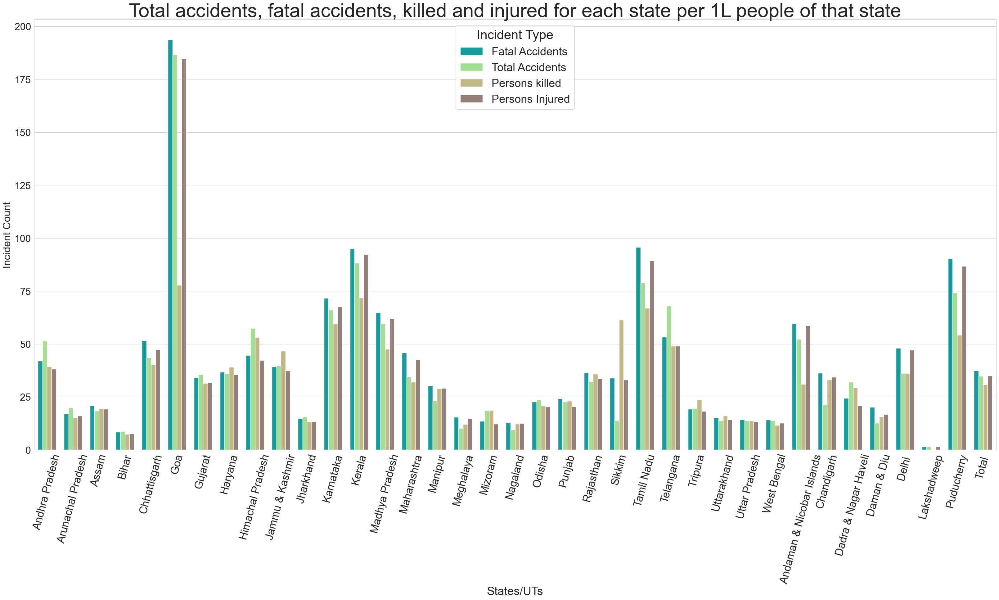

In [452]:
fig, ax = plt.subplots(figsize=(40, 18))
sns.barplot(data=df6_incidents_total_melt, x='States/UTs', y='Total Incidents',hue='Incident Type', palette='terrain', width=0.7)
plt.title("Total accidents, fatal accidents, killed and injured for each state per 1L people of that state", fontsize=45)
plt.xticks(rotation=75, fontsize=25)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=27)
plt.ylabel('Incident Count',fontsize=24)
plt.legend(loc=9, prop={'size': 26},title='Incident Type', title_fontsize=30)
plt.show()

## Q27. Number of Accidents happening in DAY and NIGHT TIME for 2014 and 2016.

In [453]:
df7_data = df7 # setting a new variable

df7_state = df7[['States/Uts']] # slicing states

#Creating day and night collumns in data frame using filter function
df7_data['Day 2014'] = df7.filter(regex='Day - 2014$',axis=1).sum(axis=1)
df7_data['Night 2014'] = df7.filter(regex='Night - 2014$',axis=1).sum(axis=1)
df7_data['Day 2016'] = df7.filter(like='(Day) - 2016',axis=1).sum(axis=1)
df7_data['Night 2016'] = df7.filter(like='(Night) - 2016',axis=1).sum(axis=1)

#slicing it without total
df7_data_without_total = df7_data.iloc[:-1,:]

#melt Function
df7_data_melt = df7_data_without_total.melt(id_vars='States/Uts', value_vars=df7_data_without_total.iloc[:,-4:],var_name='Time',value_name='Total Accidents')


### Plotting line Plot without the total collumns as it was creating too much of extreme data

Total Accidents day and night for 2014 and 2016

    Day 2014  Night 2014  Day 2016  Night 2016
36    292407      196993    289507      191145


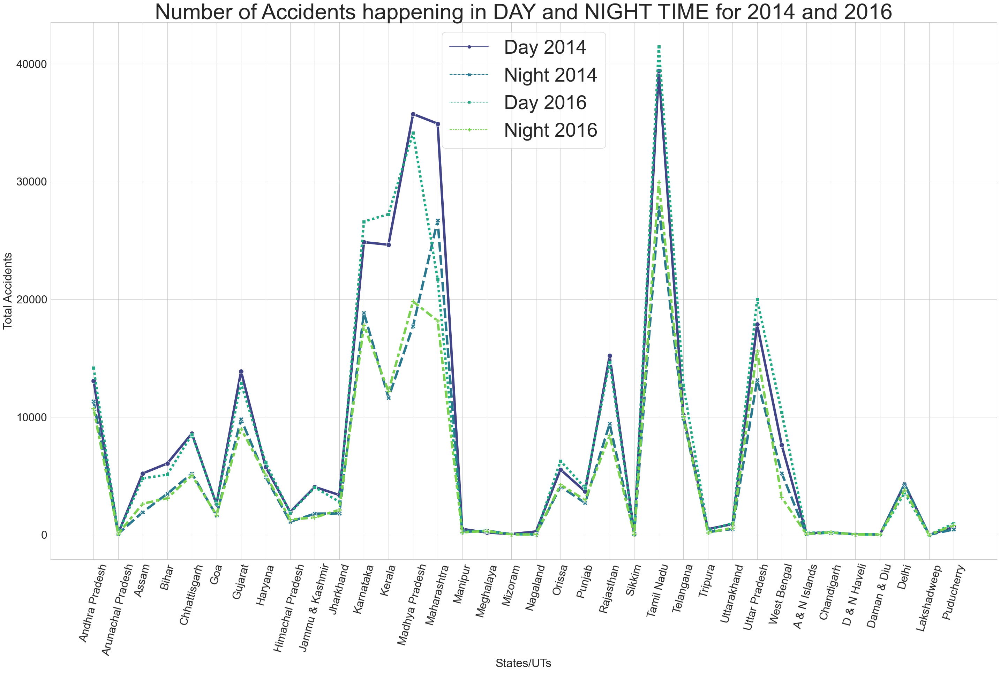

In [454]:
show_total = df7_data.iloc[-1:,-4:]
print('Total Accidents day and night for 2014 and 2016')
print()
print(show_total)

fig, ax = plt.subplots(figsize=(35, 20))
sns.lineplot(data=df7_data_melt, x='States/Uts', y='Total Accidents',hue='Time',style='Time',palette='viridis', markers=True, dashes=True, lw=5, markersize=10)
plt.title("Number of Accidents happening in DAY and NIGHT TIME for 2014 and 2016", fontsize=45)
plt.xticks(rotation=75, fontsize=23)
plt.yticks(fontsize=23)
plt.xlabel('States/UTs',fontsize=24)
plt.ylabel('Total Accidents',fontsize=24)
plt.legend(loc=9, prop={'size': 40})
plt.plot()

plt.show()